In [1]:
from datetime import date
from glob import glob
import os, sys
from os.path import join, dirname, exists
from tqdm import tqdm

import pickle as pkl
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.stats.multitest

from matplotlib import cm, colors
import matplotlib.pyplot as plt

from scipy import optimize, stats

from nilearn import plotting, masking, image
from nilearn.input_data import NiftiLabelsMasker

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

import random
import re

import pingouin as pg

/home/sungbeenpark/.local/lib/python3.10/site-packages/nilearn/input_data/__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [2]:
def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"

In [3]:
dir_root = join('/mnt/ext5/GP/fmri_data')
dir_stat = join(dir_root, 'stats/AM/GLM.reward_per_trial/5.0s_shifted')
dir_mask = join(dir_root, 'masks')

In [4]:
list_dlPFC_cTBS = [
    '09', '10', '18', '21', '22'
    , '24', '27', '34', '35', '36'
    , '38', '42', '57', '59', '62'
    , '66', '67'
]
list_M1_cTBS = [
    '08', '11', '17', '19', '20'
    , '26', '32', '33', '37', '39'
    , '40', '41', '56', '58', '61'
    , '63', '65'
]
list_dlPFC_20Hz = [
    '43', '44', '45', '46', '47'
    , '48', '49', '50', '51', '53'
    , '54', '55'
]
list_nn = list_dlPFC_cTBS + list_M1_cTBS + list_dlPFC_20Hz

---
---

/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



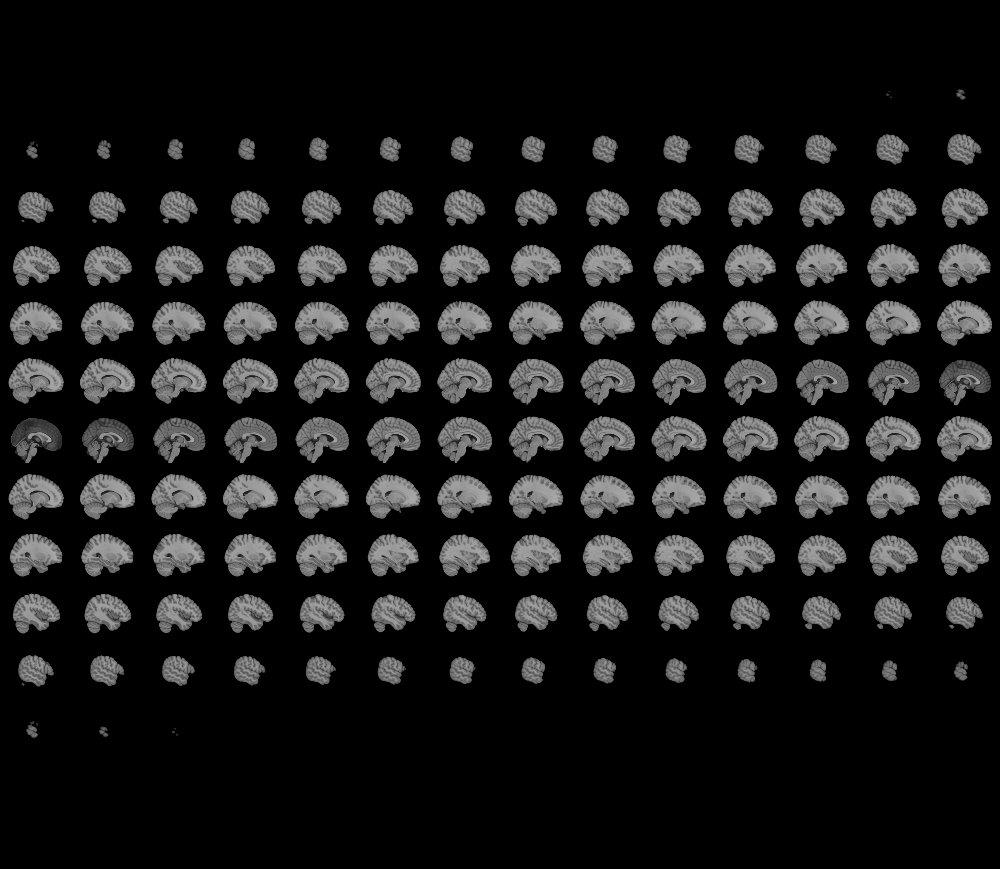
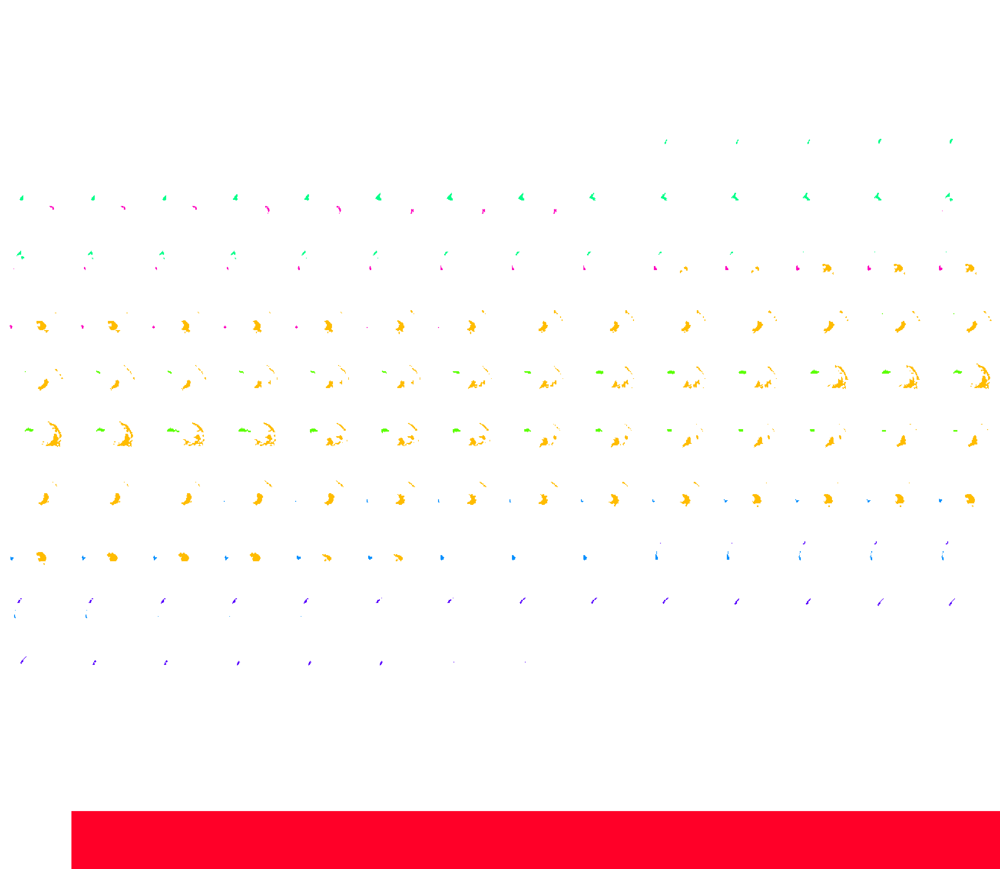

In [5]:
fname_roi = join(dir_mask, 'mask.GA.Clust_mask.GLM.reward_per_trial.5s_shifted.p=1e-5.resampled.nii')
label_roi = ['Striatum+mid_Frontal','mid_Cingulate_Cortex','left_Angular_Gyrus','right_V3','right_Angular_Gyrus','left_V3','left_Inferior_Frontal_Gyrus']
plotting.view_img(
    stat_map_img=fname_roi
    , cmap=cm.gist_rainbow.resampled(len(label_roi))
    , symmetric_cmap=False
    , resampling_interpolation='nearest'
    , opacity=0.7
)

---

In [7]:
thresh = stats.norm.isf(0.5e-3) # p=1.e-3
# thresh = stats.norm.isf(0.5e-4) # p=1.e-4
# thresh = stats.norm.isf(0.5e-5) # p=1.e-5

/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



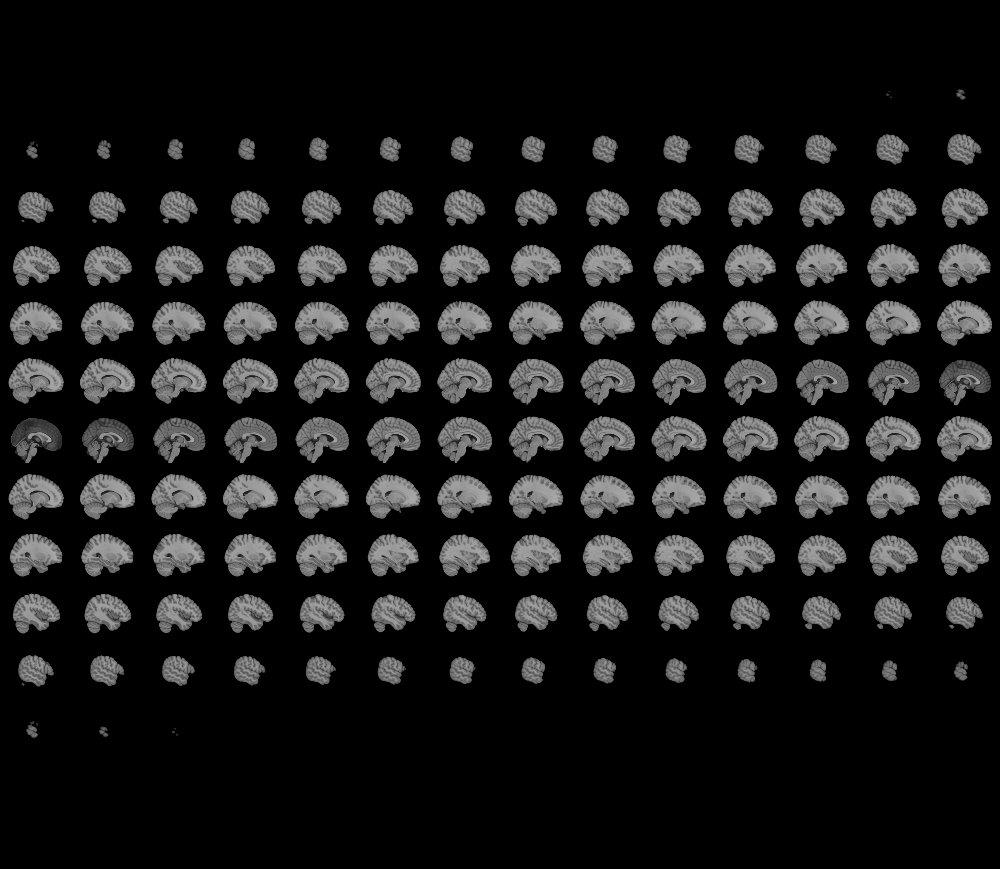
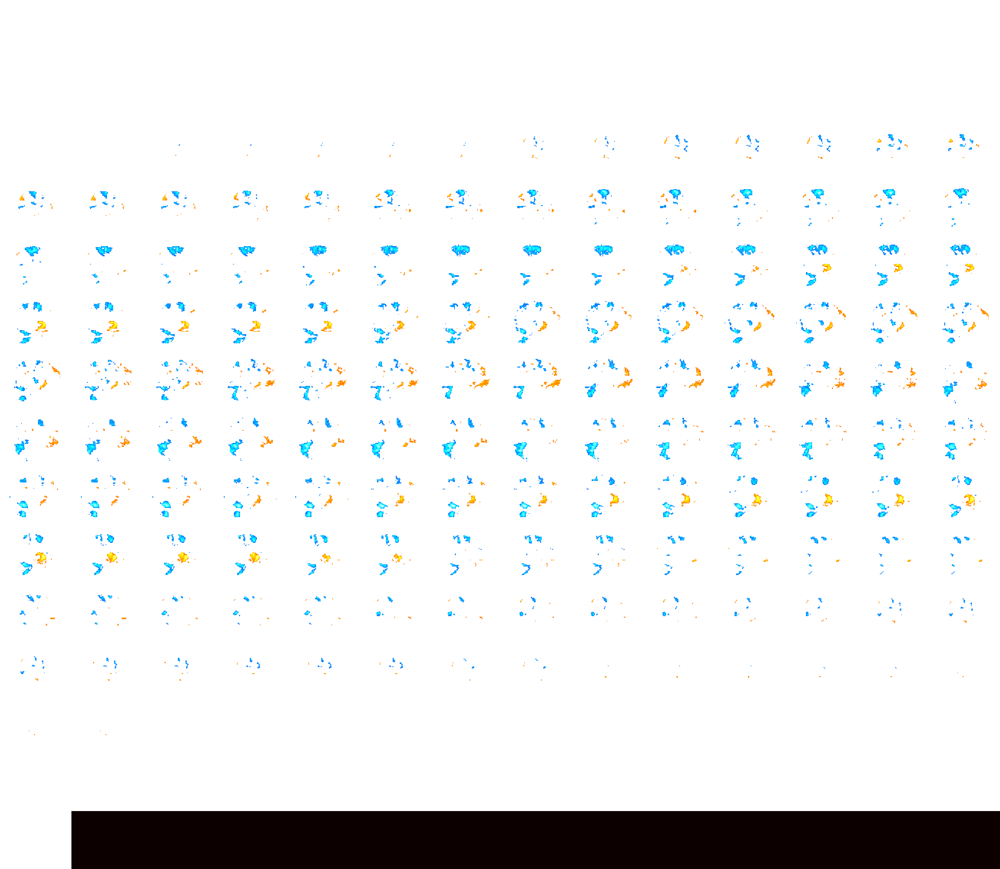

In [8]:
group = 'dlPFC_cTBS'
fname = glob(join(dir_stat, '%s.Zscr.n??.nii'%group))[0]

plotting.view_img(
    fname
    , threshold=thresh
    , resampling_interpolation='nearest'
    , opacity=0.7
)

/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



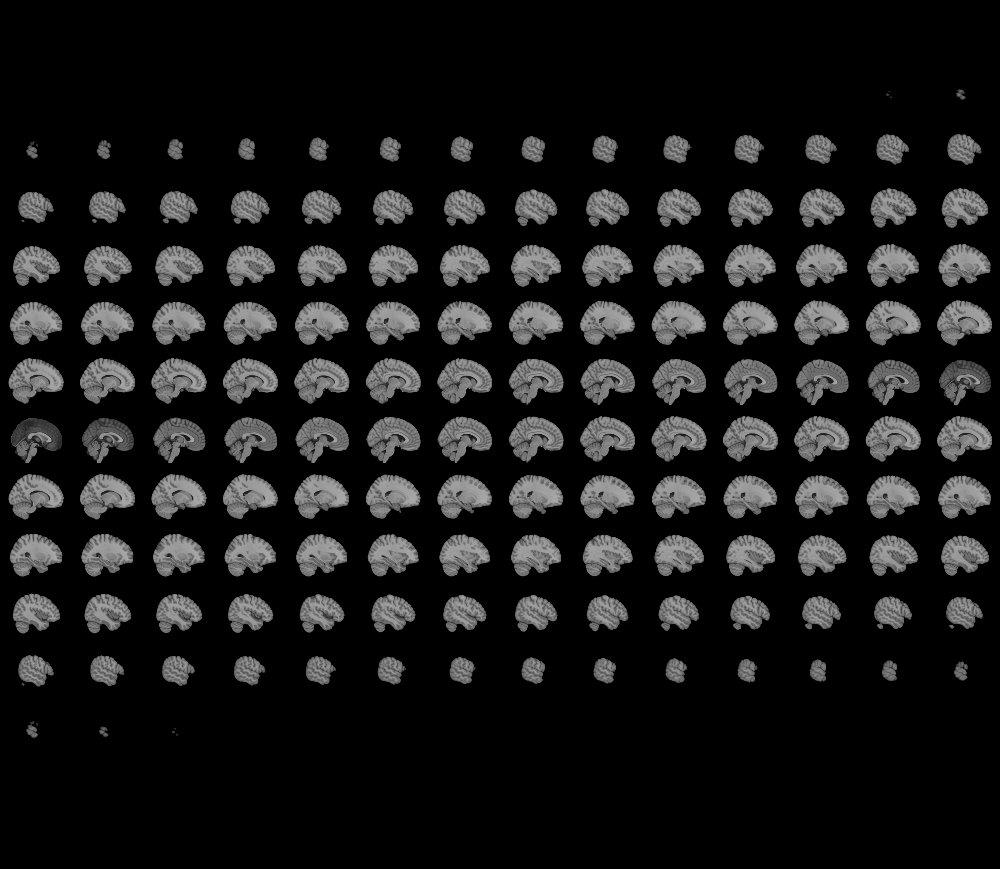
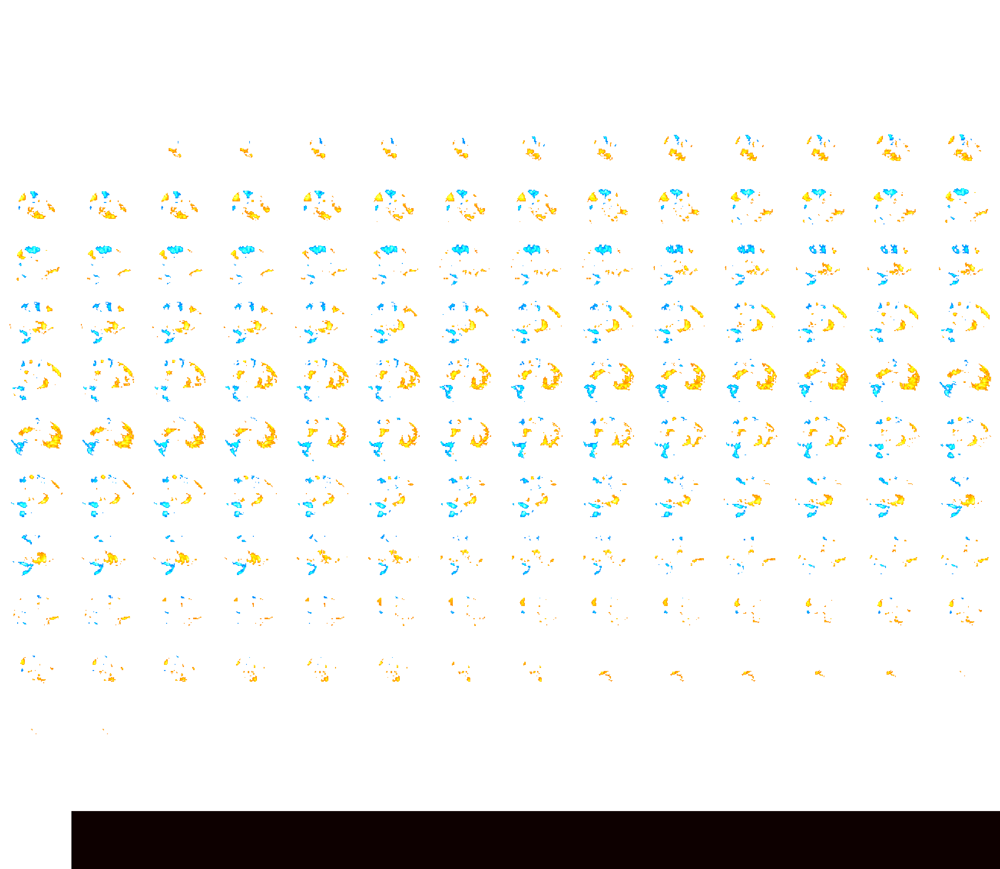

In [9]:
group = 'M1_cTBS'
fname = glob(join(dir_stat, '%s.Zscr.n??.nii'%group))[0]

plotting.view_img(
    fname
    , threshold=thresh
    , resampling_interpolation='nearest'
    , opacity=0.7
)

In [10]:
view_cut = {}
view_cut['sagittal'] = [-55, -22, -7, -3, 7, 22, 55]
view_cut['axial'] = [-14, -7, 2, 10, 35, 49, 57]

---

/tmp/ipykernel_416764/2660824122.py:107: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


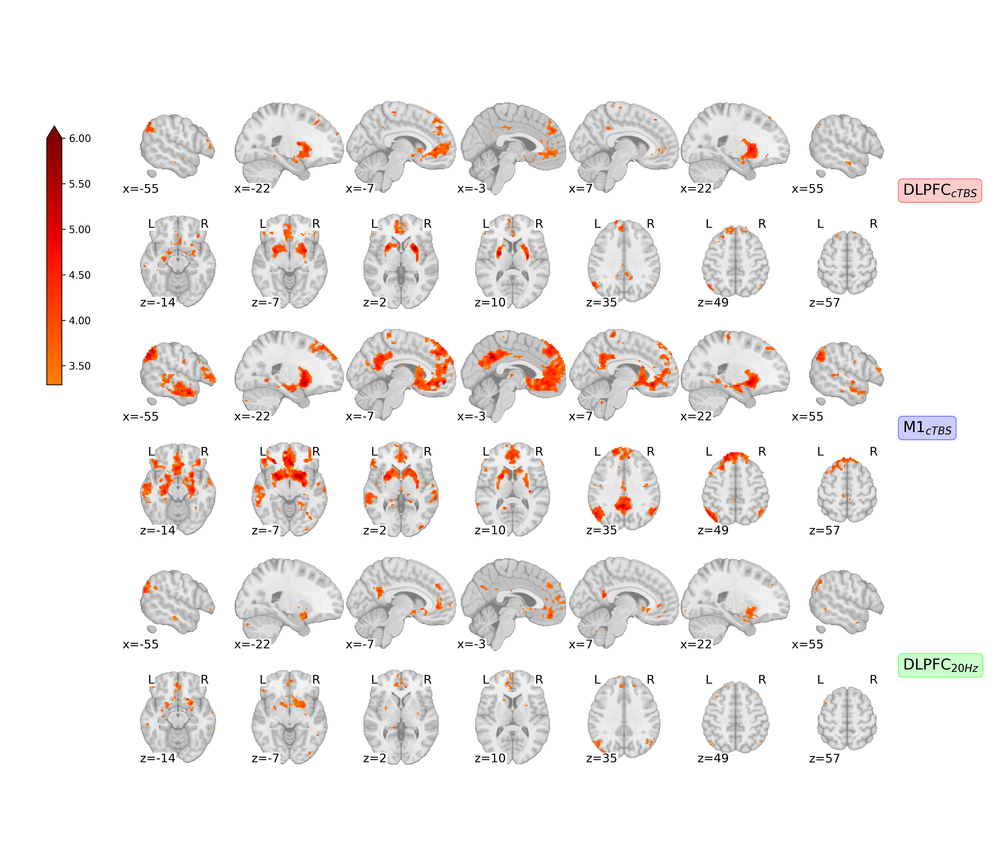

In [11]:
fig, axs = plt.subplots(nrows=6, ncols=1, figsize=(2*7,4*3), dpi=300)

vmax = 6
vmin = -vmax
for ii, group in enumerate(['dlPFC_cTBS', 'M1_cTBS', 'dlPFC_20Hz']):
    for jj, (axis, coord) in enumerate(view_cut.items()):
        ax = axs[ii*2+jj]
        fname = glob(join(dir_stat, '%s.Zscr.n??.nii'%group))[0]
        
        ## positive
        img_stat = image.math_img(
            img1=fname
            , formula='(img1>0) * img1'
        )
        
#         ## positive & negative
#         img_stat = fname
        
        g = plotting.plot_stat_map(
            img_stat
            , threshold=thresh
            , display_mode='x' if axis=='sagittal' else 'z'
            , black_bg=False
            , cut_coords=coord
            , vmax=vmax
            , cmap='jet', colorbar=False
            , axes=ax
        )

## 최대 최소 설정
norm = colors.Normalize(vmin=vmin, vmax=vmax)

################
## upper cmap ##
################

### 컬러바 생성
array_cmap = cm.jet(range(cm.jet.N))[int(norm(thresh)*256):]
cmap_new = colors.ListedColormap(array_cmap)
colormapping = cm.ScalarMappable(
    norm=colors.Normalize(vmin=thresh, vmax=vmax)
    , cmap=cmap_new
)
### 컬러바 삽입
# cax = fig.add_axes([0.05, .15, .015, .7])
cax = fig.add_axes([0.05, 0.55, .015, 0.3])
cbar = fig.colorbar(
    colormapping, extend='max'
    , orientation='vertical'
    , format='%.2f'
    , cax=cax)

# ################
# ## lower cmap ##
# ################

# ### 컬러바 생성
# array_cmap = cm.jet(range(cm.jet.N))[:int(norm(-thresh)*256)]
# cmap_new = colors.ListedColormap(array_cmap)
# colormapping = cm.ScalarMappable(
#     norm=colors.Normalize(vmin=vmin, vmax=-thresh)
#     , cmap=cmap_new
# )
# ### 컬러바 삽입
# # cax = fig.add_axes([0.05, .15, .015, .7])
# cax = fig.add_axes([0.05, 0.15, .015, 0.3])
# cbar = fig.colorbar(
#     colormapping, extend='min'
#     , orientation='vertical'
#     , format='%.2f'
#     , cax=cax
# )

## titles
fig.text(
    0.9, 0.775, r'DLPFC$_{cTBS}$'
    , size=15, rotation=0
    , ha='left', va='center'
    , bbox=dict(
        boxstyle='round'
        , ec=(1., 0.5, 0.5)
        , fc=(1., 0.8, 0.8)
    )
)
fig.text(
    0.9, 0.5, r'M1$_{cTBS}$'
    , size=15, rotation=0
    , ha='left', va='center'
    , bbox=dict(
        boxstyle='round'
        , ec=(0.5, 0.5, 1)
        , fc=(0.8, 0.8, 1)
    )
)

fig.text(
    0.9, 0.225, r'DLPFC$_{20Hz}$'
    , size=15, rotation=0
    , ha='left', va='center'
    , bbox=dict(
        boxstyle='round'
        , ec=(0.5, 1, 0.5)
        , fc=(0.8, 1, 0.8)
    )
)

fig.tight_layout()

In [14]:
fig.savefig(
    '/home/sungbeenpark/Github/labs/GP/results/statmap.%s.Zscr.positive.png'%glm
    , dpi=300, facecolor=[1,1,1,1]
    , bbox_inches = "tight"
)

---

In [12]:
img_roi = {}
## vmPFC
img_roi['vmPFC'] = image.load_img(join(dir_mask, "mask.Neurosynth_Parcellation_0.resampled_GP.vmPFC.nii"))

tmp = image.load_img(join(dir_mask, "mask.sum.caudate_4parts.separated_putamen.resampled.nii"))
## left anterior
img_roi['striatum_anterior'] = image.math_img(img1=tmp, formula='img1==2')
## left posterior
img_roi['striatum_posterior'] = image.math_img(img1=tmp, formula='img1==3')

# plotting.view_img(
#     stat_map_img=
#     , cmap=cm.jet.resampled(2)
#     , symmetric_cmap=False
# )

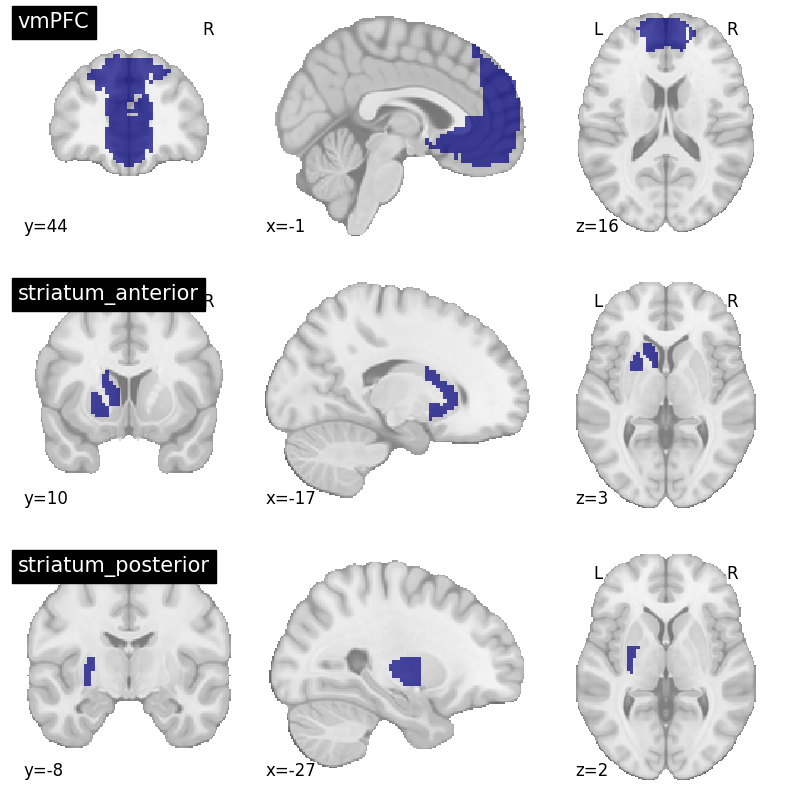

In [13]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(10,10))

for ii, (name, img) in enumerate(img_roi.items()):
    ax = axs[ii]
    plotting.plot_roi(img, axes=ax, draw_cross=False, title=name)

---

In [15]:
pval = 1.e-3
thresh = stats.norm.isf(0.5*pval)
print(pval, thresh)

0.001 3.2905267314918945


In [16]:
def get_region_and_stim(subj):
    nn = subj[2:]
    region = 'M1' if nn in list_M1_cTBS else 'DLPFC'
    stim = '20Hz' if nn in list_dlPFC_20Hz else 'cTBS'
    return region, stim

In [17]:
## individual data
list_fname = sorted(glob(join(dir_stat, 'GP??/Rew#1_Zstat.nii')))

df = pd.DataFrame()
for name, img in tqdm(img_roi.items()):
    for fname in list_fname:
        subj = fname.split('/')[-2]
        region, stim = get_region_and_stim(subj)
        group = r'%s$_{%s}$'%(region, stim)
        
        zscr = masking.apply_mask(
            imgs=fname
            , mask_img=img
        )
        nvoxels = (zscr>thresh).sum()
        volume = 2.5**3 * nvoxels * 0.001
        
        new_row = pd.Series(
            {
                'group':group, 'region':region, 'stim':stim
                , 'roi':name, 'nvoxels':nvoxels, 'volume':volume
                , 'pval':'%.4e'%pval, 'type':'two-tailed', 'Z_thresh':'%.4f'%(thresh)
            }
            , name = subj
        )
        df = pd.concat(
            [df, new_row.to_frame().T]
            , axis='index'
            , ignore_index=False
        )
df

100%|██████████| 3/3 [00:27<00:00,  9.27s/it]


,group,region,stim,roi,nvoxels,volume,pval,type,Z_thresh
GP08,M1$_{cTBS}$,M1,cTBS,vmPFC,3215,50.234375,1.0000e-03,two-tailed,3.2905
GP09,DLPFC$_{cTBS}$,DLPFC,cTBS,vmPFC,1318,20.59375,1.0000e-03,two-tailed,3.2905
GP10,DLPFC$_{cTBS}$,DLPFC,cTBS,vmPFC,1156,18.0625,1.0000e-03,two-tailed,3.2905
GP11,M1$_{cTBS}$,M1,cTBS,vmPFC,2912,45.5,1.0000e-03,two-tailed,3.2905
GP17,M1$_{cTBS}$,M1,cTBS,vmPFC,1053,16.453125,1.0000e-03,two-tailed,3.2905
...,...,...,...,...,...,...,...,...,...
GP62,DLPFC$_{cTBS}$,DLPFC,cTBS,striatum_posterior,4,0.0625,1.0000e-03,two-tailed,3.2905
GP63,M1$_{cTBS}$,M1,cTBS,striatum_posterior,0,0.0,1.0000e-03,two-tailed,3.2905
GP65,M1$_{cTBS}$,M1,cTBS,striatum_posterior,4,0.0625,1.0000e-03,two-tailed,3.2905
GP66,DLPFC$_{cTBS}$,DLPFC,cTBS,striatum_posterior,23,0.359375,1.0000e-03,two-tailed,3.2905


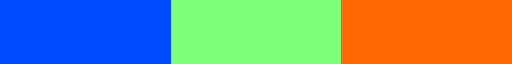

In [18]:
tmp = cm.jet(np.linspace(0.2, 0.8, 3))
palette = [colors.rgb2hex(rgb, keep_alpha=True) for rgb in tmp]

colors.ListedColormap(palette)

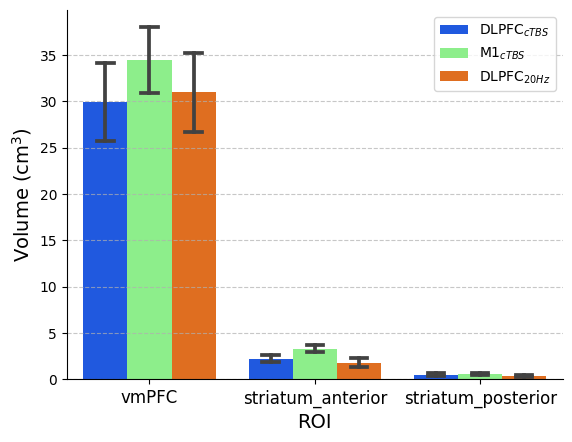

In [19]:
g = sns.barplot(
    data=df, x='roi', y='volume', hue='group'
    , hue_order=(r'DLPFC$_{cTBS}$', r'M1$_{cTBS}$', r'DLPFC$_{20Hz}$')
    , palette=palette
    , errorbar='se', capsize=0.1
)
g.grid(axis='y', linestyle='--', alpha=0.7)
g.legend(loc='best')
g.set_ylabel(r'Volume (cm$^{3}$)', fontsize=14)
g.set_xlabel(r'ROI', fontsize=14)
g.set_xticklabels(g.get_xticklabels(), fontsize=12)

sns.despine()

In [22]:
## group data
a = glob(join(dir_stat, 'dlPFC_cTBS.Zscr.n??.nii'))
b = glob(join(dir_stat, 'M1_cTBS.Zscr.n??.nii'))
c = glob(join(dir_stat, 'dlPFC_20Hz.Zscr.n??.nii'))
list_fname = a+b+c

df = pd.DataFrame()
for name, img in tqdm(img_roi.items()):
    for fname in list_fname:
        region = 'DLPFC' if 'dlPFC' in fname else 'M1'
        stim = 'cTBS' if 'cTBS' in fname else '20Hz'
        region, stim = fname.split('/')[-1].split('.')[0].split('_')
        group = r'%s$_{%s}$'%(region, stim)
        zscr = masking.apply_mask(
            imgs=fname
            , mask_img=img
        )
        nvoxels = (zscr>thresh).sum()
        volume = 2.5**3 * nvoxels * 0.001
        new_row = pd.Series(
            {
                'group':group, 'region':region, 'stim':stim
                , 'roi':name, 'nvoxels':nvoxels, 'volume':volume
                , 'pval':'%.4e'%pval, 'type':'two-tailed', 'Z_thresh':'%.4f'%(thresh)}
        )
        df = pd.concat(
            [df, new_row.to_frame().T]
            , axis='index'
            , ignore_index=True
        )
df

100%|██████████| 3/3 [00:01<00:00,  1.63it/s]


,group,region,stim,roi,nvoxels,volume,pval,type,Z_thresh
0,dlPFC$_{cTBS}$,dlPFC,cTBS,vmPFC,757,11.828125,1.0000e-03,two-tailed,3.2905
1,M1$_{cTBS}$,M1,cTBS,vmPFC,2268,35.4375,1.0000e-03,two-tailed,3.2905
2,dlPFC$_{20Hz}$,dlPFC,20Hz,vmPFC,395,6.171875,1.0000e-03,two-tailed,3.2905
3,dlPFC$_{cTBS}$,dlPFC,cTBS,striatum_anterior,190,2.96875,1.0000e-03,two-tailed,3.2905
4,M1$_{cTBS}$,M1,cTBS,striatum_anterior,288,4.5,1.0000e-03,two-tailed,3.2905
5,dlPFC$_{20Hz}$,dlPFC,20Hz,striatum_anterior,26,0.40625,1.0000e-03,two-tailed,3.2905
6,dlPFC$_{cTBS}$,dlPFC,cTBS,striatum_posterior,46,0.71875,1.0000e-03,two-tailed,3.2905
7,M1$_{cTBS}$,M1,cTBS,striatum_posterior,40,0.625,1.0000e-03,two-tailed,3.2905
8,dlPFC$_{20Hz}$,dlPFC,20Hz,striatum_posterior,3,0.046875,1.0000e-03,two-tailed,3.2905


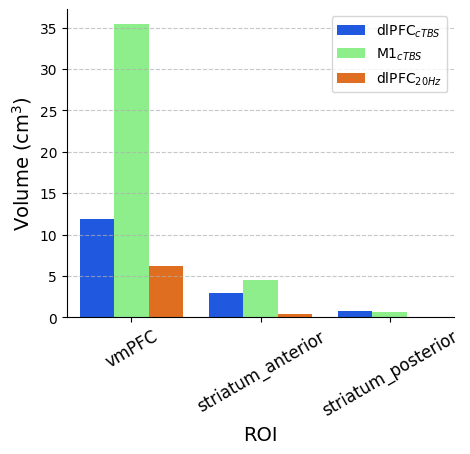

In [26]:
fig, ax = plt.subplots(figsize=(5,4))

g = sns.barplot(
    data=df, x='roi', y='volume', hue='group'
#     , order=('M1_cTBS', 'dlPFC_cTBS')
    , palette=palette
    , ax=ax
)
g.grid(axis='y', linestyle='--', alpha=0.7)
g.legend(loc='best')
g.set_ylabel(r'Volume (cm$^{3}$)', fontsize=14)
g.set_xlabel(r'ROI', fontsize=14)
g.set_xticklabels(g.get_xticklabels(), fontsize=12, rotation=30)

# ## Bounding box
# bbox = g.get_position()
# rect = (0.4, 0.6, 0.55, 0.3) # (x0, y0, w, h)
# ax_insert = fig.add_axes(rect)
# nilearn.plotting.plot_roi(
#     img_roi
#     , display_mode='ortho', draw_cross=False
# #     , cut_coords=[0, 40, 10]
#     , axes=ax_insert
# )

sns.despine()

# fig.savefig(
#     '/home/sungbeenpark/Github/labs/GP/results/barplot.%s.cluster_volume.group.png'%glm
#     , dpi=300, facecolor=[1,1,1,1]
#     , bbox_inches = "tight"
# )

---

In [30]:
## check validation
list_fname = sorted(glob(join(dir_stat, 'GP??/Rew#1_Coef.nii')))

dt = pd.DataFrame()
for fname in tqdm(list_fname):
    subj = fname.split('/')[-2]
    region, stim = get_region_and_stim(subj)
    group = '%s_%s'%(region, stim)
    
    coef = masking.apply_mask(imgs=fname, mask_img=img_roi['striatum_anterior'])
    line = pd.Series(data=[group, *coef], index=['group', *range(coef.shape[0])], name=subj)
    dt = pd.concat(
        [dt, line.to_frame().T]
        , axis='index'
        , ignore_index=False
    )

tstat = dt.groupby('group').mean()/dt.groupby('group').sem()
tstat.rename_axis(None, inplace=True)
tstat

100%|██████████| 46/46 [00:10<00:00,  4.22it/s]


,0,1,2,3,4,5,6,7,8,9,...,354,355,356,357,358,359,360,361,362,363
DLPFC_20Hz,4.516668,3.897728,2.883924,3.201264,4.264377,4.454628,3.710729,3.858536,3.909228,3.127370,...,3.864626,3.536856,2.949480,2.517183,2.577557,3.339435,3.153172,2.652045,2.478564,2.771248
DLPFC_cTBS,7.271562,7.067183,5.993254,5.415939,4.821072,5.187357,6.682695,6.664649,6.911616,6.379800,...,4.341036,4.481859,4.056462,3.117075,2.313693,4.817193,4.422926,3.332140,4.881338,4.664528
M1_cTBS,5.399277,6.028253,6.104060,5.399683,5.276579,5.540744,5.284668,6.094380,6.449876,7.011446,...,5.177480,4.583054,4.904102,5.052899,5.240862,4.436248,5.485360,5.818339,4.395213,5.419516


In [33]:
group = 'dlPFC_20Hz'
Tstat = masking.apply_mask(
    imgs=glob(join(dir_stat,'%s.Tstat.n??.nii'%group))[0]
    , mask_img=img_roi['striatum_anterior']
)

In [34]:
np.square(Tstat-tstat.loc['DLPFC_20Hz']).sum()

1.2650406136090753e-11

---